<a href="https://colab.research.google.com/github/zelal-Eizaldeen/deeplearning_course/blob/main/4_3BuildingCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Building a Convolutional Neural Network

- We will now look at how **to build a convolutional neural network.** This slide shows a figure of a simple convolutional neural network that can be used to classify objects in an image.

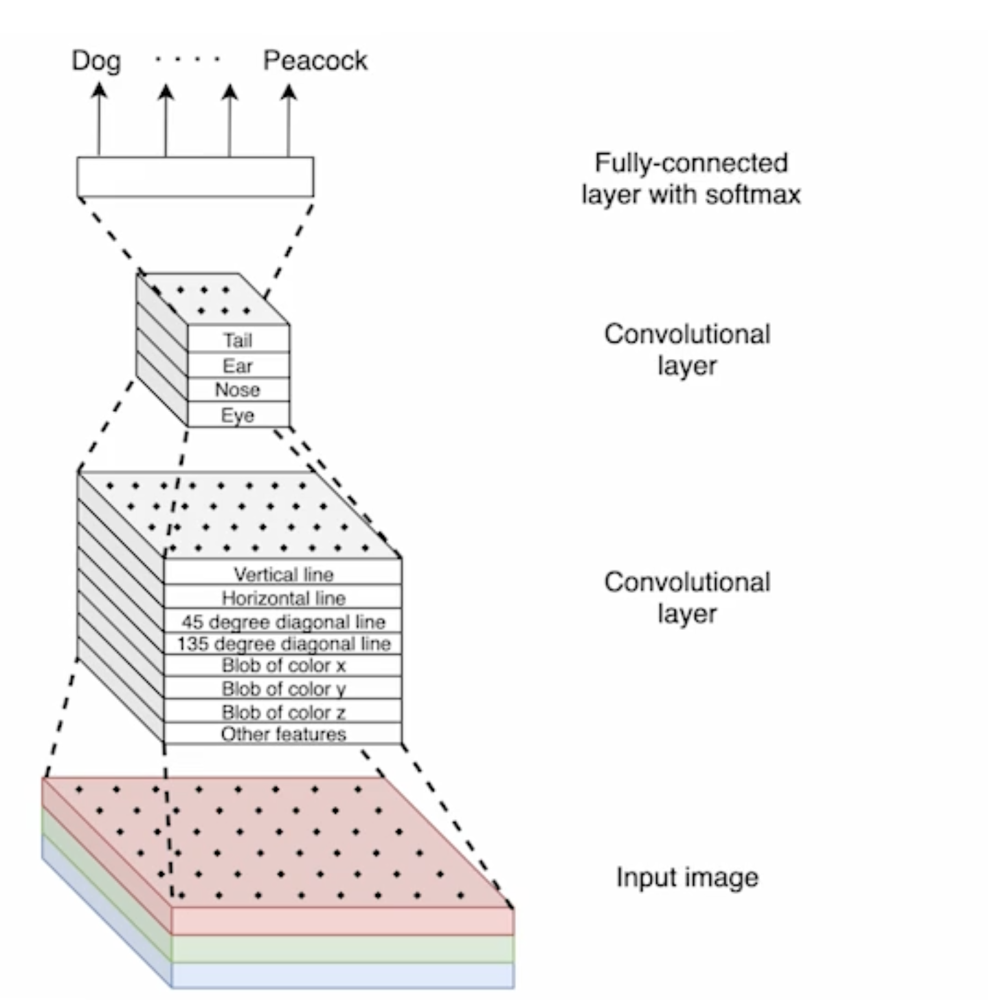

It **starts with a convolutional layer**. This convolutional layer will identify **low-level features in the input image**. Example of such features are **lines or colors**, or other low level objects.

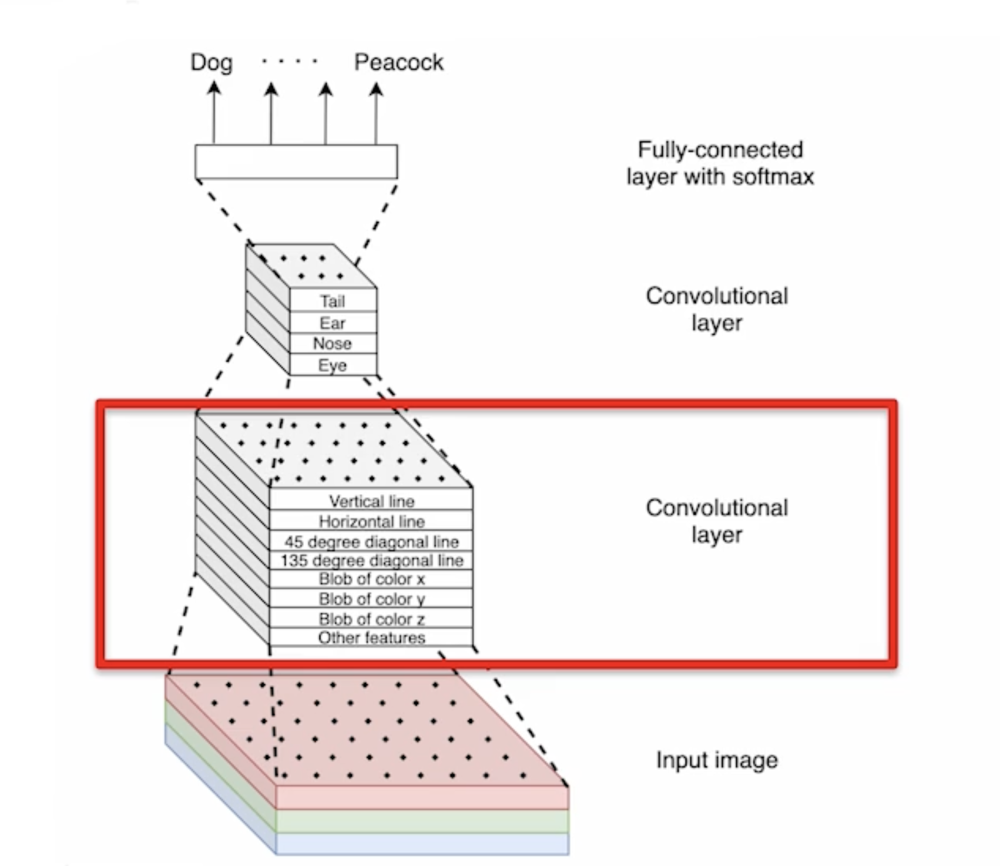

The **second convolutional layer will identify higher level features**.

In this case, if we want to identify different types of animals, **it'll look for features like tail, ear, nose, or an eye.**

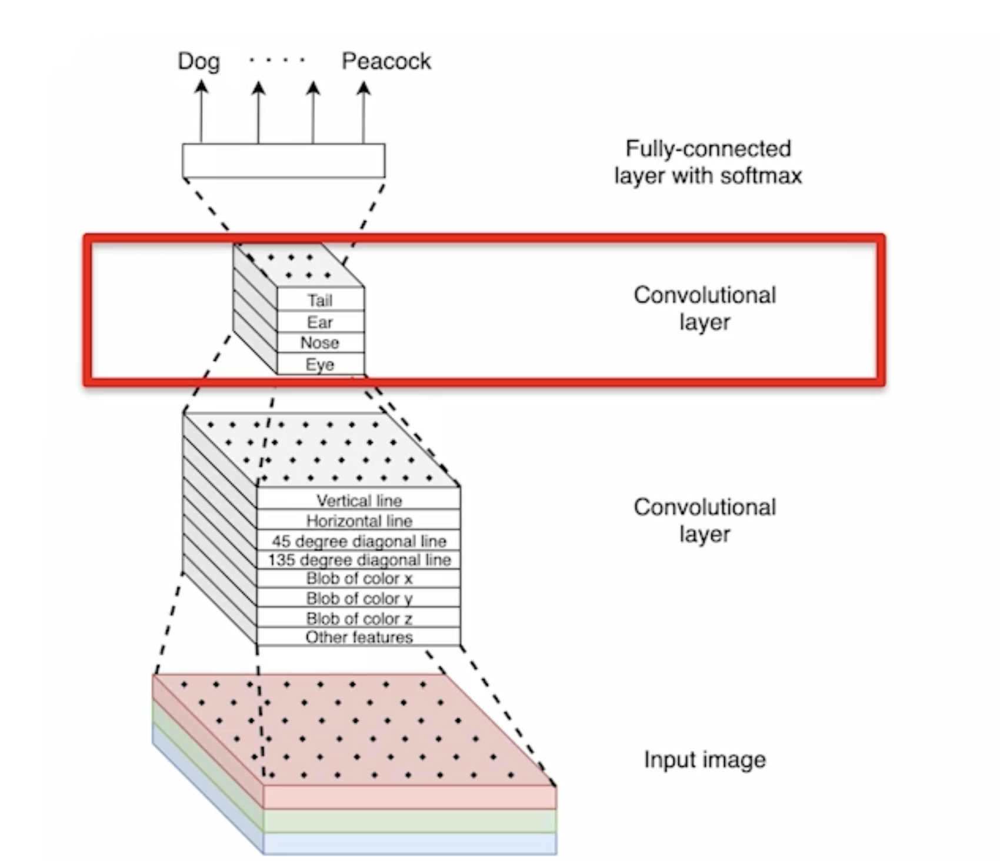

We will then **end with a fully connected layer with a softmax output. This will summarize all the features of an object and classify it into a specific object**: such as a dog or a peacock.

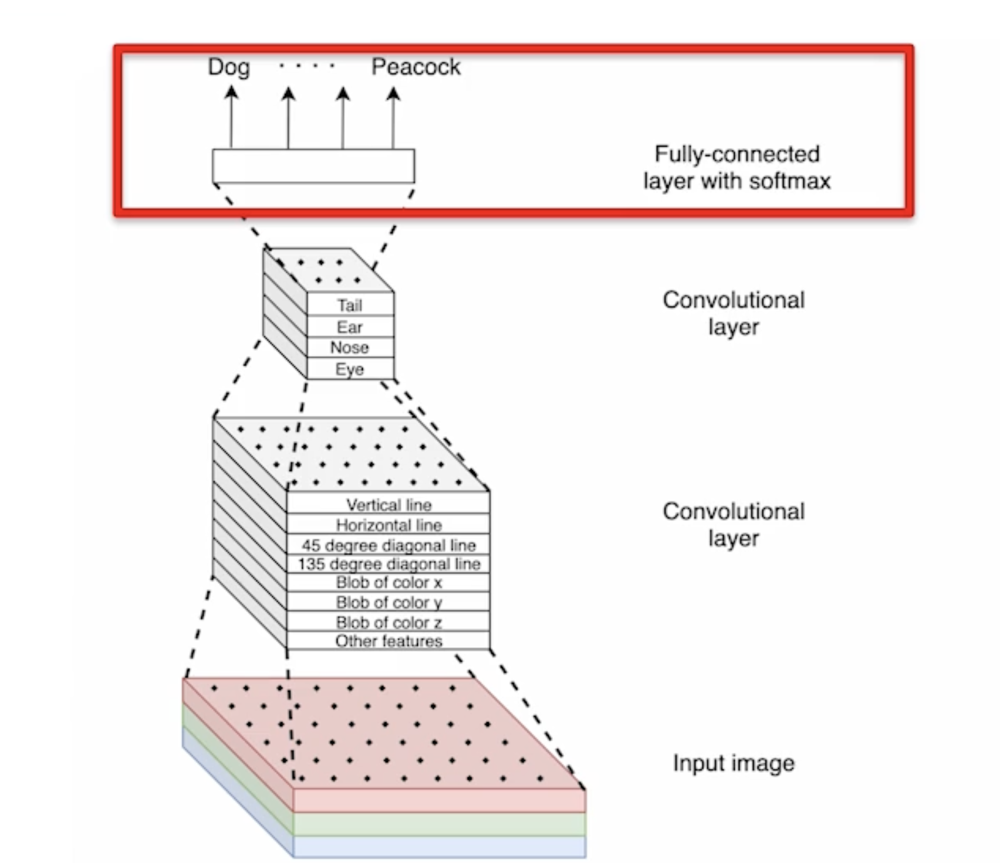

Note that there is **no specific relationship between the number of channels in the layers.**

 We can see in this example that **we start with a three-channel image**.

We go to an **eight-channel first layer**, and **then a second convolutional layer or four channels.** The number of channels are simply chosen independently.

It is common that the **width and the height shrink as you move deeper into the network.** However, this is not necessary, it depends on the stride.
- **If you use a stride of one**, the resolution will not shrink,
- **while if you have a greater stride**, you will see smaller and smaller layers as you move further into the network.


Also note that although this is a convolutional neural network, we still have a fully connected layer. That is it's th**e presence of the convolutional layer that makes it a CNN**, but a CNN does not only consist of convolutional layers. - In the case of **classification**, it's very common to have **fully connected layers at the end of the convolutional neural network**.


This is a very simple convolution neural network in the figure. In a typical CNN, you'll have more layers, each layer will be wider and higher, and we'll have more channels.

#Softmax operation
Let's now revisit the softmax operation that was used at the end of the neural network.
- We use softmax for **multi-class classification,**
- softmax consists of **n outputs**, **one for each class that we want to classify**.
- We will **normalize the values of these outputs**, summing them together will result in 1.0.  
- We can interpret **each output as the probability of that object** belonging to a certain class.

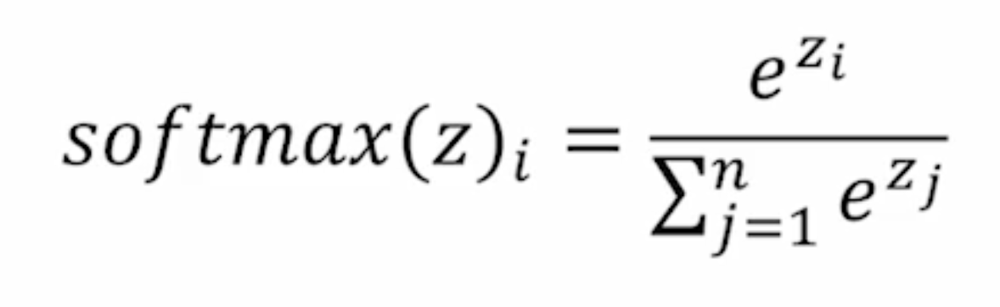

The chart shows how the weighted sums as the blue bars. These are the weighted sums of the neurons. After we apply the softmax, they will have been reduced to the red bars, and we can see that the red bars will add up to 1.0.

In this example, class two has the highest probability, it's more than 50%,

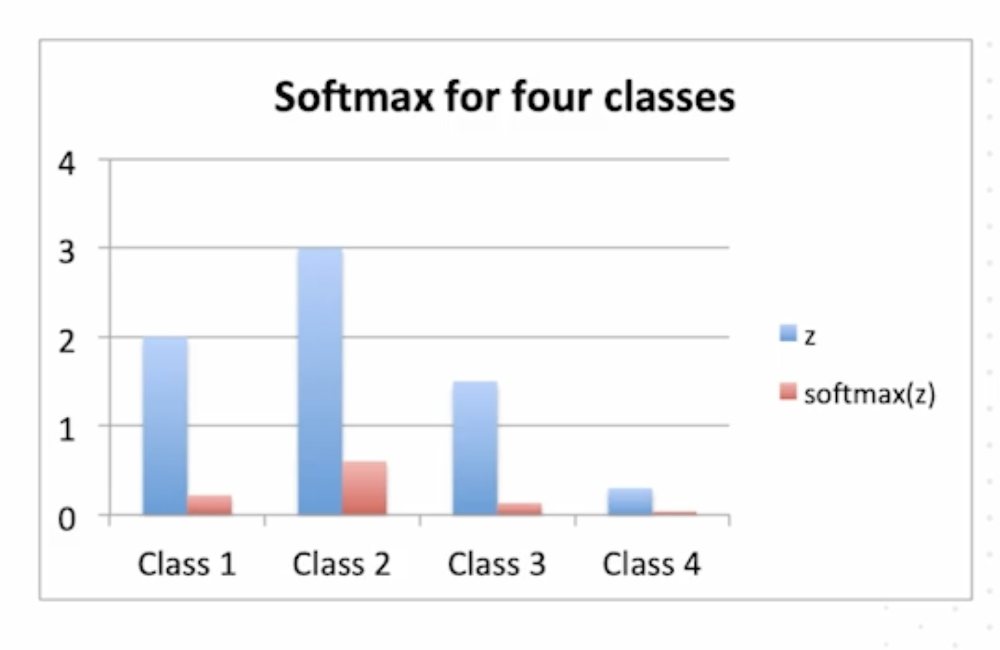

When we use the *softmax layer*, we want to **use the cross-entropy loss function**.

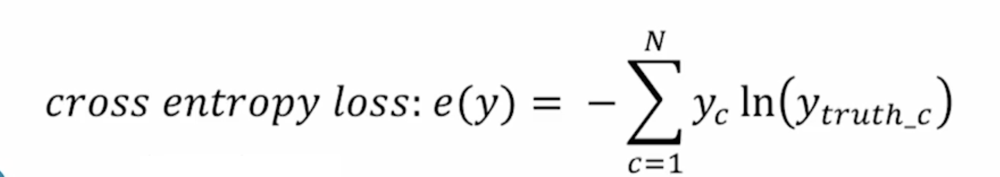

# Why fully connected layer?

Let's now reason about the **fully connected layer at the top of the network**,it's used to **summarize the features in the entire image**. **The top convolutional layer will consist of high-level features at specific locations in the image.**

However, each neuron in the fully connected layer will be detecting a specific object, in this example, a **specific animal**. Let's take a look at the **neuron indicating if there is a peacock in the picture or not**. This neuron will look for if there is a lot of **eyes in the picture**, so it'll have high values of the **weights that connect to the feature map that is detecting eyes**, because if there are a lot of eyes in the picture, there is a high probability of that picture actually being a peacock.
- Note that there are many complex dependencies when trying to classify images, so it's often beneficial to have multiple fully connected layers on the top. This is because we have already** seen that having just a single neuron has a very limited capabilit**y.

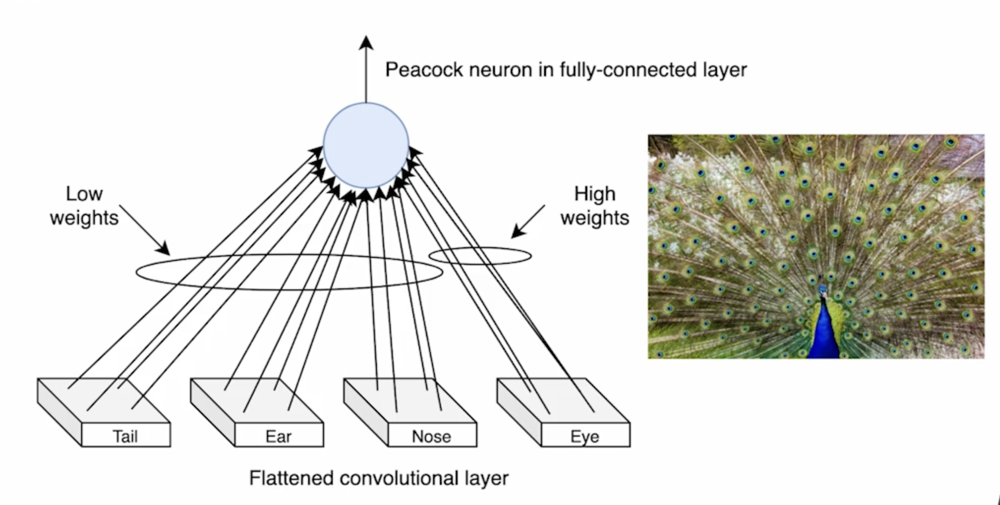

To gain some more insights into the properties of a convolutional layer, let's now **compare the number of weights in a convolutional layer with the number of weights in a fully connected layer**.



For a **fully connected layer**, the number of weights will equal the number of neurons in the layer times the number of neurons in the previous layer.

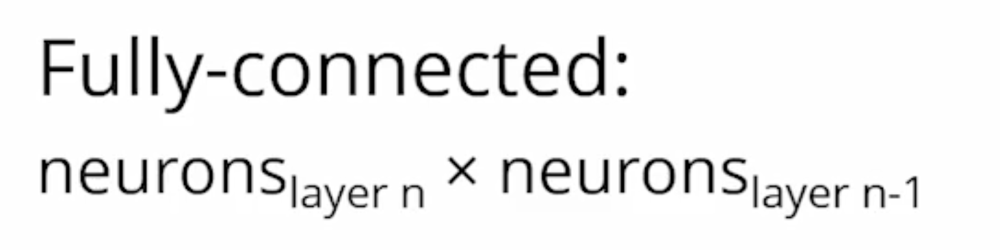

For the **convolutional layer**, it will depend on the number of channels in the layer times the kernel size times the channels in the previous layer.

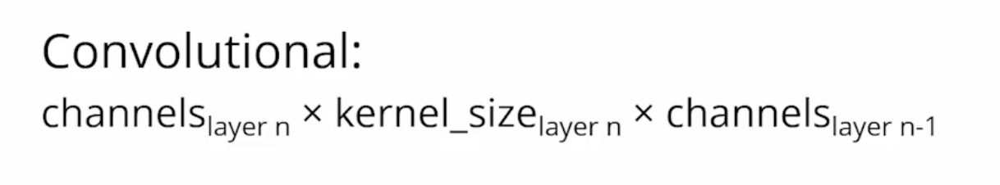

This results in **fewer number of unique weights in a convolutional layer than in a comparable fully connected layer**. This comes from the fact that the convolutional layer applies **weight sharing **and is **sparsely connected**.

Let's now also look at the **comparison between the number of computations needed for a convolutional layer versus a fully connected layer**. This will be determined both by the number of neurons in a layer and the number of weights per neuron.

For a **fully connected layer**, the number of weights per neuron will be the number of **neurons in the previous layer**, so the **number of computations will be the number of neurons times the number of neurons in the previous layer**.

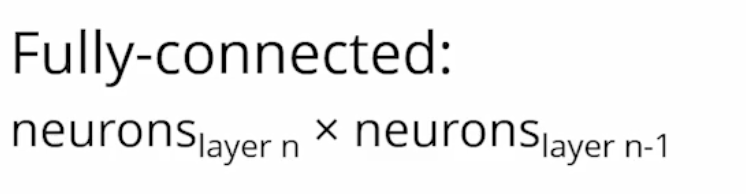

For **the convolutional layer**, the number of weights per neuron is the number of channels in the previous layer times the kernel size. The number of computations will now be the number of neurons times the kernel size times the channels in the previous layer.

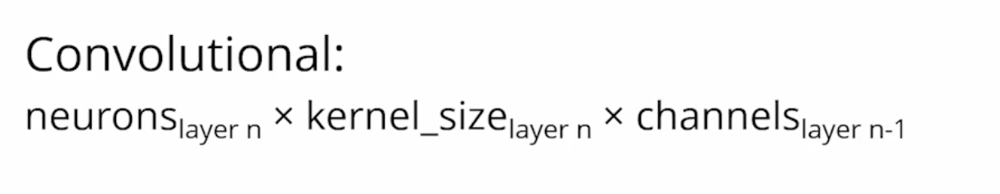


The **convolutional layer typically have fewer calculations than the fully connected layer, and this is due to the sparse connections in the convolutional layer.**

- The unique number of weights for the convolutional layer is **independent of the size of the previous layer**, or the **size of the input image**. The reason for this is that the layer is sparsely connected.

- Due to **weight sharing**, the convolution layer will have fewer unique weights than the number of total weights. This will **reduce the search space when training the network and make it easier to find a good solution**. It'll also mean that we need to **allocate less memory to store all the weights**.
- However, we still have many more weights when we look at the total computations because **each unique weight will be used multiple times**, so we know that the** total number of weights in the convolution network is greater than the number of unique weights**.
- The total number of weights in the convolutional network is still significantly **lower than the total number of weights in the fully connected network with the same neuron count**.

# Max-Pooling operation
We will talk about max-pooling. The max-pooling operation can **reduce the resolution of a layer that is reduce the width and the height, but without using any weights**. We simply **take a group of pixels or group of neurons**, for example, **two by two, and then output a single value**. We will output the maximum value among that group of neuron outputs.


The idea is that if you have found a feature somewhere in the image, it is sufficient to** know approximately where this image was and you don't need to know exactly where it is. **

A **convolution operation is applied across all channels**, so although we apply the convolution on three channels, we still just end up with a single value. The** max-pooling operation is applied separately per channel**, so max-pooling operation will result is the same number of output channels as there are input channels to the operation.

# 1. Convolution operates across all channels
When you apply a convolution filter to an image (or a feature map) that has multiple channels — for example, an RGB image with 3 channels — each filter actually spans all those channels simultaneously.
- Example:

Suppose the input image has shape:
Height × Width × Channels = 32 × 32 × 3 (RGB)

You apply one convolutional filter (kernel) of size 3×3×3 (the 3 covers all channels). This gives **one scalar output for that position**— combining the information from all input channels.
- Even though the filter reads from 3 channels, it produces one output feature map (1 channel).
If you have 64 filters, you’ll get 64 output channels.

# 2. Max-pooling operates per channel independently
Pooling (e.g., max-pooling or average pooling) doesn’t mix information across channels.

For each channel separately, it slides a small window (like 2×2) and picks the maximum value in that window.

It reduces the spatial size (Height and Width) but keeps the number of channels the same.
If your input has shape H × W × C, and you apply 2×2 max-pooling with stride 2, the output will be (H/2) × (W/2) × C.

# Analogy
Think of convolution like a chef tasting a dish — combining all ingredients (channels) to form one flavor (output).

Think of pooling like sampling each ingredient separately to find the strongest flavor in its own group (per channel).

# Padding

Finally, let's talk a little bit about **padding, which is a technique to handle the edges of the image**. This figure shows pixels in green at the bottom of the image, followed by **two layers of neurons** where A and B are neurons in the top layer.**Note that I eliminated the two-dimensional image here to simplify the figure**.

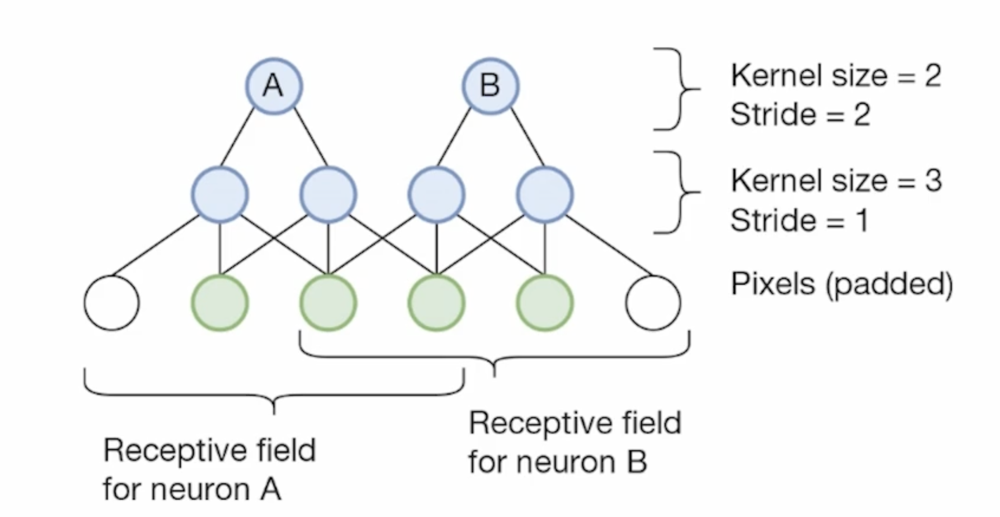

 Let's consider the neuron in the first layer. It has a **kernel size of three because it's connected to three of the input pixels**.

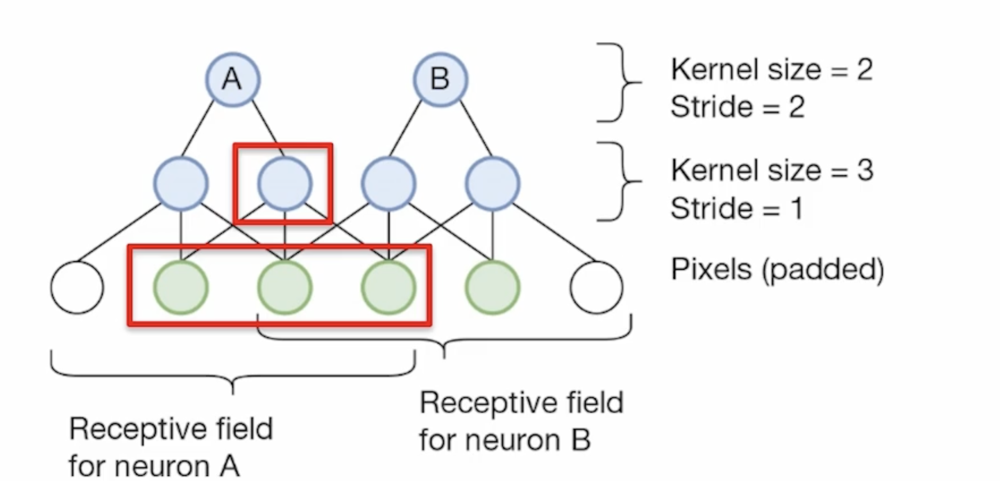

Now, let's consider the neuron that is at **the edge of the figure. At the very left, we see that one of the pixels that is input to that neuron is missing.**

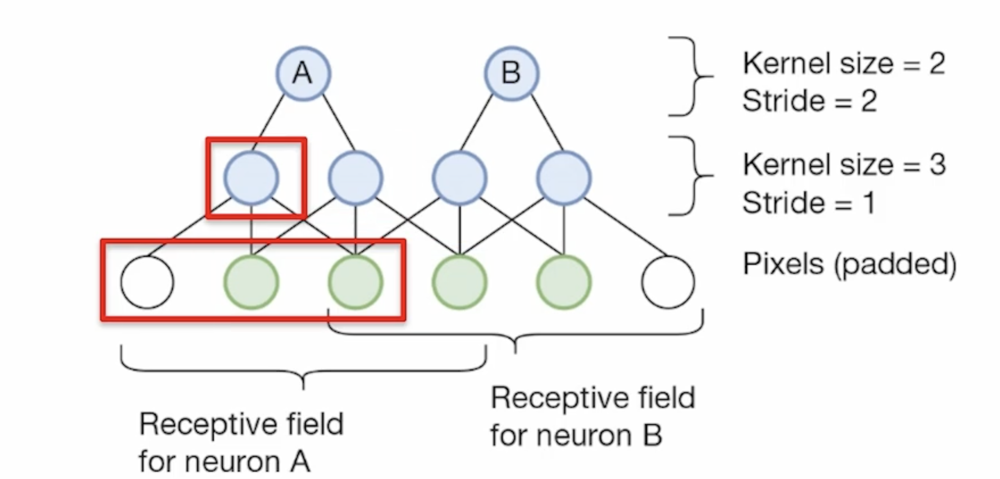

That is why we introduce padding, so we simply create a pixel that has the value zero, so we can give some kind of input to the neuron.

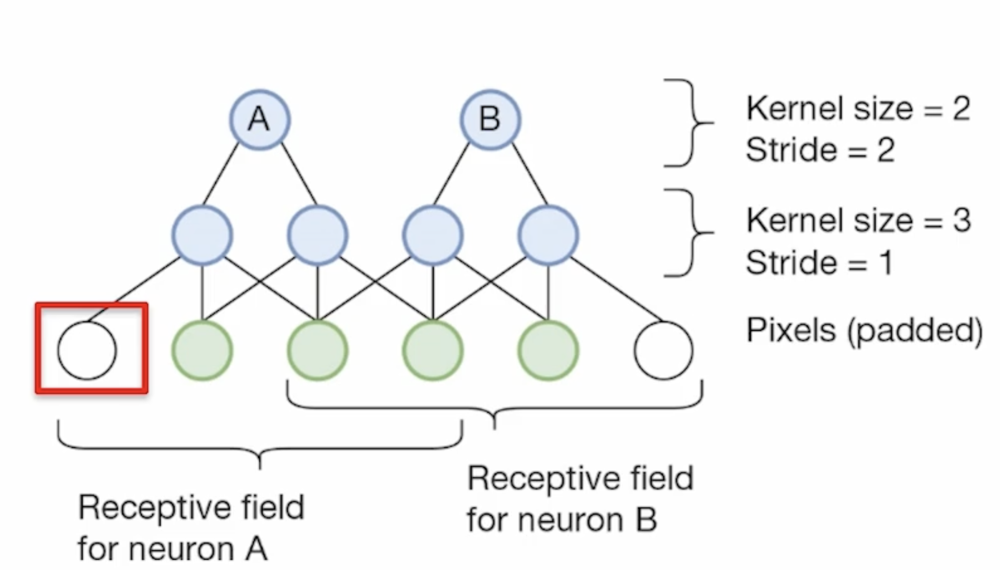

**If we would not apply padding, the resolution of the layer would be reduced compared to the input image even if we used a stride of one**.

We often use something known as **same padding**, that means that the **resolution of the convolutional layer will have the same resolution as the input image, assuming a stride of one**.

The number of padding values depends on the kernel size.
- If we have a **larger kernel size, we will need to add more pixels as padding.**

Finally, **we did mention how a neuron has a receptive field equal to the kernel size**, but we can also talk about the receptive field with respect to the original image. For example, in this example, we can see that the **neuron A has a receptive field of four pixels in the original image, even though its kernel size is just two**, so this is a **combination of the kernel size for neuron A as well as the kernel size of the neurons that is feeding neuron A**.

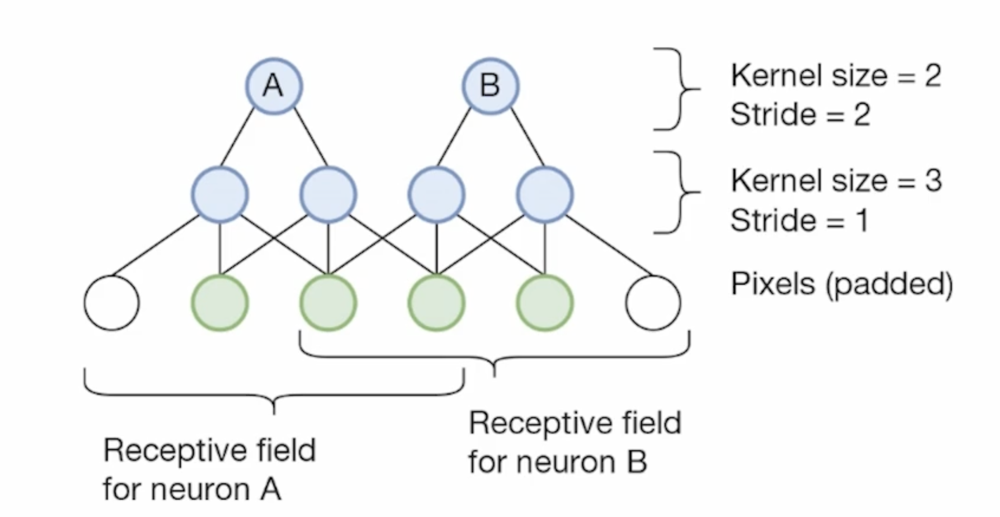

#Reference
Learning Deep Learning by Mangus Ekman